## Feature Extraction of timeseries

In [5]:
import numpy as np
import pandas as pd
import matplotlib
from scipy import stats
import matplotlib.pyplot as plt
from collections import Counter

In [85]:
df = pd.read_csv("all/training_set.csv")
df_meta = pd.read_csv("all/training_set_metadata.csv")
df.head()

,object_id,mjd,passband,flux,flux_err,detected
0,615,59750.4229,2,-544.810303,3.622952,1
1,615,59750.4306,1,-816.434326,5.553370,1
2,615,59750.4383,3,-471.385529,3.801213,1
3,615,59750.4450,4,-388.984985,11.395031,1
4,615,59752.4070,2,-681.858887,4.041204,1


In [ ]:
objects_meta = df_meta.index
objects = np.array(df["object_id"])
objects


In [5]:
keep_flux = df["flux"]
keep_flux

0          -544.810303
1          -816.434326
2          -471.385529
3          -388.984985
4          -681.858887
5         -1061.457031
6          -524.954590
7          -393.480225
8          -355.886780
9          -548.013550
10         -815.188599
11         -475.516052
12         -405.663818
13         -421.199066
14         -554.903198
15         -820.042786
16         -477.004730
17         -400.270386
18         -415.286896
19         -630.523682
20         -921.002502
21         -518.533997
22         -422.184509
23         -422.815094
24         -280.039520
25         -449.095612
26         -316.704865
27         -332.885437
28         -365.075775
29          391.399231
              ...     
1421675       3.294472
1421676     113.988297
1421677      12.464979
1421678     -13.734149
1421679     -14.478923
1421680      12.178056
1421681     -20.815857
1421682      54.361107
1421683       9.912425
1421684      17.719660
1421685     -86.457382
1421686     -39.215195
1421687    

In [6]:
from multiprocessing import Pool
import multiprocessing as mp

def applyParallel_1(dfGrouped, func):
    p = Pool(mp.cpu_count())
    ret_list = p.map(func, [group for name, group in dfGrouped])
    return pd.concat(ret_list, axis=1)
    


In [7]:
df_meta.head()

,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,target
object_id,,,,,,,,,,,
615,349.046051,-61.943836,320.796530,-51.753706,1,0.0000,0.0000,0.0000,NaN,0.017,92
713,53.085938,-27.784405,223.525509,-54.460748,1,1.8181,1.6267,0.2552,45.4063,0.007,88
730,33.574219,-6.579593,170.455585,-61.548219,1,0.2320,0.2262,0.0157,40.2561,0.021,42
745,0.189873,-45.586655,328.254458,-68.969298,1,0.3037,0.2813,1.1523,40.7951,0.007,90
1124,352.711273,-63.823658,316.922299,-51.059403,1,0.1934,0.2415,0.0176,40.4166,0.024,90


In [14]:
df.tail()

,Unnamed: 0,Unnamed: 0.1,id,mjd,passband,flux
103109575,103109575,103109575,7847.0,1094.0,1.0,4.497800
103109576,103109576,103109576,7847.0,1094.0,2.0,6.635559
103109577,103109577,103109577,7847.0,1094.0,3.0,15.843707
103109578,103109578,103109578,7847.0,1094.0,4.0,18.620119
103109579,103109579,103109579,7847.0,1094.0,5.0,59.214134


In [7]:
#Normalize flux based on passband

def applyParallel(dfGrouped, func):
    p = Pool(mp.cpu_count())
    ret_list = p.map(func, [group for name, group in dfGrouped])
    return pd.concat(ret_list)

def normalize_flux(series):
    series = pd.DataFrame(series)
    mean = series.groupby("passband").agg({'flux':'mean'}).reset_index()
    std = series.groupby("passband").agg({'flux':'std'}).reset_index()
    mean.columns = ["passband","mean"]
    std.columns = ["passband","std"]
    series = pd.merge(series, mean, on="passband", how="left")
    series = pd.merge(series, std, on="passband", how="left")
    
    series["flux"] = (series["flux"]-series["mean"])/series["std"]
    return series

#df = df.groupby(['object_id']).apply(normalize_flux)

In [12]:
df.tail()

,object_id,mjd,passband,flux,flux_err,detected,target
1421700,130779836,60555.9838,4,-39.881969,46.477093,0,6
1421701,130779836,60560.0459,1,14.894439,18.947685,0,6
1421702,130779836,60571.0225,5,30.593130,50.695290,0,6
1421703,130779836,60585.9974,4,-23.471439,44.819859,0,6
1421704,130779836,60588.0372,0,-41.214264,51.665123,0,6


In [10]:
df = df.set_index("object_id")

In [11]:
df

,mjd,passband,flux,flux_err,detected,target
object_id,,,,,,
615,59750.4229,2,-544.810303,3.622952,1,92
615,59750.4306,1,-816.434326,5.553370,1,92
615,59750.4383,3,-471.385529,3.801213,1,92
615,59750.4450,4,-388.984985,11.395031,1,92
615,59752.4070,2,-681.858887,4.041204,1,92
615,59752.4147,1,-1061.457031,6.472994,1,92
615,59752.4224,3,-524.954590,3.552751,1,92
615,59752.4334,4,-393.480225,3.599346,1,92
615,59752.4435,5,-355.886780,10.421921,1,92


In [3]:
from admit.util.peakfinder.PeakDetect import PeakDetect

def derivative(series):
    #mn_pos = np.mean(series[(series[["flux"]] >= 0)].flux)
    #mn_neg =np.mean(series[(series[["flux"]] < 0)].flux)
    mn = np.mean(series.flux)
    series = series[(series["flux"]>mn)]
    fl_d = np.diff(series["flux"])
    tm_d = np.diff(series["mjd"])
    deriv = fl_d/tm_d
    count1 = 0
    for i in range(len(deriv)-1):
        if(deriv[i]*deriv[i+1]<0):
            count1+=1
    return count1

counts = df.groupby(["object_id", "passband"]).apply(PeakDetect)
counts = counts.unstack(level=-1)

new_columns = [
    "no_of_changes" + str(i)  for i in range(6)
]
counts.columns = new_columns
counts

ImportError: No module named 'admit'

In [12]:
counts.to_csv("train/neg_flux/derivatives.csv")

In [19]:
trgts = df_meta["target"]
sts = df
counts["mean"] = counts.mean(axis=1)
unique_classes = trgts.unique()

plt.figure(figsize=(10,10))
counts["target"] = trgts
for t in unique_classes:
    if(t in [42,90,67,95,62,15,52,6]):
        c = 'green'
    else:
        c='yellow'
    st = counts[counts["target"]==t]
    plt.hist(st["mean"], color=c)
plt.savefig('foo.png')


In [106]:
counts.to_csv("train/neg_flux/derivatives.csv")

In [130]:
counts = pd.read_csv("train/neg_flux/derivatives.csv")
counts.set_index("object_id", inplace=True)
counts.head()

,no_of_changes0,no_of_changes1,no_of_changes2,no_of_changes3,no_of_changes4,no_of_changes5
object_id,,,,,,
615,12,16,15,17,18,20
713,20,18,18,20,17,10
730,25,16,6,5,3,10
745,17,1,3,2,4,10
1124,19,9,10,5,1,9


In [40]:
def test(series, threshold):
    series.reset_index(inplace=True)
    mean = series.flux.mean()
    
    max_flux = series.flux.idxmax()
    series1 = (series[:max_flux])
    series2 = (series[max_flux:])
    i = -1
    try:
        while(np.array(series1.flux)[i] > np.array(series1.flux)[i-1]-(threshold*mean)):
            i-=1
        mjd1 = np.array(series1.mjd)[i]

        i = 0

        while(np.array(series2.flux)[i] > np.array(series2.flux)[i+1]-(threshold*mean)):
            i+=1

        mjd2 = np.array(series2.mjd)[i]
        mjd = mjd2 - mjd1
    except:
        mjd = 0
    return mjd

s = df.groupby("object_id").apply(test, 0.1)

In [41]:
s = pd.DataFrame(s)
s.columns = ["mjd_my_diff"]
s.to_csv("train/neg_flux/mjd_diffs.csv")


In [42]:
s

,mjd_my_diff
object_id,
615,19.9825
713,3.0621
730,3.0024
745,216.3490
1124,2.9725
1227,2.9934
1598,0.0000
1632,14.8975
1920,2.9522


In [94]:
df = pd.read_csv("all/training_set.csv")
trgts = np.array(pd.merge(df[['object_id']], df_meta[['target']], on = 'object_id', how = 'outer'))[:,[1]]
df["target"] = trgts
df.tail()

,object_id,mjd,passband,flux,flux_err,detected,target
1421700,130779836,60555.9838,4,-39.881969,46.477093,0,6
1421701,130779836,60560.0459,1,14.894439,18.947685,0,6
1421702,130779836,60571.0225,5,30.593130,50.695290,0,6
1421703,130779836,60585.9974,4,-23.471439,44.819859,0,6
1421704,130779836,60588.0372,0,-41.214264,51.665123,0,6


In [19]:
##WHOLE

# General aggregates
from tsfresh.feature_extraction import extract_features
# Features to compute with tsfresh library. Fft coefficient is meant to capture periodicity
fcp = {
        'flux': {
            'longest_strike_above_mean': None,
            'longest_strike_below_mean': None,
            'mean_change': None,
            'mean_abs_change': None,
            'length': None,
        },
                
        'flux_by_flux_ratio_sq': {
            'longest_strike_above_mean': None,
            'longest_strike_below_mean': None,       
        },
                
        'flux_passband': {
            'fft_coefficient': [
                    {'coeff': 0, 'attr': 'abs'}, 
                    {'coeff': 1, 'attr': 'abs'}
                ],
            'kurtosis' : None, 
            'skewness' : None,
        },
                
        'mjd': {
            'maximum': None, 
            'minimum': None,
            'mean_change': None,
            'mean_abs_change': None,
        },
    }

aggs_all = {
        'flux': ['min', 'max', 'mean', 'median', 'std', 'skew'],
        'flux_err': ['min', 'max', 'mean', 'median', 'std', 'skew'],
        'detected': ['mean'],
        'flux_ratio_sq':['sum', 'skew'],
        'flux_by_flux_ratio_sq':['sum','skew'],
    }

aggs_pb = {
        'flux': ['min', 'max', 'mean', 'median', 'std', 'skew'],
        'flux_err': ['min', 'max', 'mean', 'median', 'std', 'skew'],
        'flux_ratio_sq':['sum', 'skew'],
        'flux_by_flux_ratio_sq':['sum','skew'],
    }

fcp = {
        'flux': {
            'longest_strike_above_mean': None,
            'longest_strike_below_mean': None,
            'mean_change': None,
            'mean_abs_change': None,
            'length': None,
        },
                
        'flux_by_flux_ratio_sq': {
            'longest_strike_above_mean': None,
            'longest_strike_below_mean': None,       
        },
                
        'flux_passband': {
            'fft_coefficient': [
                    {'coeff': 0, 'attr': 'abs'}, 
                    {'coeff': 1, 'attr': 'abs'}
                ],
            'kurtosis' : None, 
            'skewness' : None,
        },
                
        'mjd': {
            'maximum': None, 
            'minimum': None,
            'mean_change': None,
            'mean_abs_change': None,
        },
    }

def featurize(df, n_jobs=8):
    """
    Extracting Features from train set
    Features from olivier's kernel
    very smart and powerful feature that is generously given here https://www.kaggle.com/c/PLAsTiCC-2018/discussion/69696#410538
    per passband features with tsfresh library. fft features added to capture periodicity https://www.kaggle.com/c/PLAsTiCC-2018/discussion/70346#415506
    """
    
    df = process_flux(df)
    agg_df1 = df.groupby(['object_id']).agg(aggs_all)

    agg_df2 = df.groupby(['object_id','passband']).agg(aggs_pb)
    agg_df2 = agg_df2.unstack(level=-1)

    agg_df1.columns = [ '{}_{}'.format(k, agg) for k in aggs_all.keys() for agg in aggs_all[k]]
    agg_df2.columns = [ '{}_{}_{}'.format(k, agg,p) for k in aggs_pb.keys() for agg in aggs_pb[k] for p in range(0,6)]
    agg_df1 = process_flux_agg(agg_df1) # new feature to play with tsfresh
    
    # Add more features with
    agg_df_ts_flux_passband = extract_features(df, 
                                               column_id='object_id', 
                                               column_sort='mjd', 
                                               column_kind='passband', 
                                               column_value='flux', 
                                               default_fc_parameters=fcp['flux_passband'], n_jobs=n_jobs)

    agg_df_ts_flux = extract_features(df, 
                                      column_id='object_id', 
                                      column_value='flux', 
                                      default_fc_parameters=fcp['flux'], n_jobs=n_jobs)

    agg_df_ts_flux_by_flux_ratio_sq = extract_features(df, 
                                      column_id='object_id', 
                                      column_value='flux_by_flux_ratio_sq', 
                                      default_fc_parameters=fcp['flux_by_flux_ratio_sq'], n_jobs=n_jobs)

    # Add smart feature that is suggested here https://www.kaggle.com/c/PLAsTiCC-2018/discussion/69696#410538
    # dt[detected==1, mjd_diff:=max(mjd)-min(mjd), by=object_id]
    df_det = df[df['detected']==1].copy()
    agg_df_mjd = extract_features(df_det, 
                                  column_id='object_id', 
                                  column_value='mjd', 
                                  default_fc_parameters=fcp['mjd'], n_jobs=n_jobs)
    agg_df_mjd['mjd_diff_det'] = agg_df_mjd['mjd__maximum'].values - agg_df_mjd['mjd__minimum'].values
    del agg_df_mjd['mjd__maximum'], agg_df_mjd['mjd__minimum']
    
    agg_df_ts_flux_passband.index.rename('object_id', inplace=True) 
    agg_df_ts_flux.index.rename('object_id', inplace=True) 
    agg_df_ts_flux_by_flux_ratio_sq.index.rename('object_id', inplace=True) 
    agg_df_mjd.index.rename('object_id', inplace=True)      
    agg_df_ts = pd.concat([agg_df1, 
                           agg_df2,
                           agg_df_ts_flux_passband, 
                           agg_df_ts_flux, 
                           agg_df_ts_flux_by_flux_ratio_sq, 
                           agg_df_mjd], axis=1).reset_index()
   
    return agg_df_ts

agg_train = featurize(df)

ImportError: cannot import name 'LinearNDInterpolator'

In [96]:
agg_train.set_index("object_id", inplace=True)
agg_train.head()

,flux_by_flux_ratio_sqskew_0,flux_by_flux_ratio_sqskew_1,flux_by_flux_ratio_sqskew_2,flux_by_flux_ratio_sqskew_3,flux_by_flux_ratio_sqskew_4,flux_by_flux_ratio_sqskew_5,flux_by_flux_ratio_sqsum_0,flux_by_flux_ratio_sqsum_1,flux_by_flux_ratio_sqsum_2,flux_by_flux_ratio_sqsum_3,...,5__kurtosis,5__skewness,flux__length,flux__longest_strike_above_mean,flux__longest_strike_below_mean,flux__mean_abs_change,flux__mean_change,flux_by_flux_ratio_sq__longest_strike_above_mean,flux_by_flux_ratio_sq__longest_strike_below_mean,mjd_diff_det
object_id,,,,,,,,,,,,,,,,,,,,,
615,-0.213985,-0.069064,0.073857,-0.292343,-0.274897,-0.404506,-626381.909593,-5.626857e+08,-2.058831e+08,-1.397955e+08,...,-1.592820,0.125268,352.0,19.0,29.0,202.114067,1.999688,35.0,4.0,873.7903
713,-1.228117,-2.782672,-2.220930,-1.888909,-2.295932,-2.233363,-5916.693412,-8.363832e+03,-6.553036e+03,-5.218126e+03,...,-0.797047,0.218182,350.0,50.0,73.0,2.935177,-0.050944,199.0,8.0,846.8017
730,2.788126,1.625511,4.493774,4.071669,3.552281,3.637144,2.274455,2.032471e+01,2.042918e+04,3.385113e+04,...,3.583130,1.680352,330.0,13.0,32.0,4.227614,-0.008131,4.0,222.0,78.7737
745,5.519682,7.481619,7.346086,6.261827,5.777566,4.194393,4016.307490,3.510925e+06,5.506723e+06,3.874527e+06,...,12.134629,3.170857,351.0,19.0,115.0,7.065548,0.008044,4.0,201.0,123.6872
1124,-1.166071,5.824856,5.211346,5.210225,5.216334,5.097895,104.843171,5.897740e+04,1.132796e+06,1.131902e+06,...,14.434470,3.657305,352.0,19.0,158.0,6.727352,0.012543,10.0,231.0,133.9113


In [4]:
agg_train.to_csv("train/neg_flux/agg_train.csv")

In [13]:
agg_train = pd.read_csv("train/neg_flux/agg_train.csv")
agg_train.set_index("object_id", inplace=True)
agg_train.head()

,flux_errmean_0,flux_errmean_1,flux_errmean_2,flux_errmean_3,flux_errmean_4,flux_errmean_5,flux_errskew_0,flux_errskew_1,flux_errskew_2,flux_errskew_3,...,3__skewness,"4__fft_coefficient__coeff_0__attr_""abs""","4__fft_coefficient__coeff_1__attr_""abs""",4__kurtosis,4__skewness,"5__fft_coefficient__coeff_0__attr_""abs""","5__fft_coefficient__coeff_1__attr_""abs""",5__kurtosis,5__skewness,mjd_diff_det
object_id,,,,,,,,,,,,,,,,,,,,,
615,3.823448,5.029014,3.380299,3.340116,3.798761,7.636021,-0.038907,0.002414,-0.232705,-0.227460,...,0.293128,3245.366349,2741.539785,-1.548319,0.200096,2704.641265,2893.344217,-1.592820,0.125268,873.7903
713,2.331400,1.416982,1.192936,1.640155,2.268854,5.314447,0.425360,1.337865,1.159080,0.821230,...,-0.167176,50.414646,203.892482,-1.190245,-0.064134,100.473776,143.963093,-0.797047,0.218182,846.8017
730,2.057984,1.445473,1.254838,1.781935,2.502323,6.011377,0.235110,1.417387,1.199474,0.995498,...,2.662075,219.745132,202.532898,6.081065,2.537802,231.509177,199.286370,3.583130,1.680352,78.7737
745,1.954723,1.316564,1.155521,1.667482,2.786468,6.698346,0.311095,1.501828,1.147964,0.733654,...,3.751603,735.528417,680.055280,13.747434,3.476420,591.037583,523.503586,12.134629,3.170857,123.6872
1124,2.251139,1.701628,1.424134,1.927300,2.798486,6.523610,0.255342,0.691469,0.665665,0.297156,...,3.603208,574.553907,524.107264,16.377058,3.904008,393.114268,357.907185,14.434470,3.657305,133.9113


In [ ]:
def test(series):
    mjd_max = series
    print (mjd_max["flux"].max)
df.groupby(['object_id']).apply(test)

<bound method Series.max of 0      -544.810303
1      -816.434326
2      -471.385529
3      -388.984985
4      -681.858887
5     -1061.457031
6      -524.954590
7      -393.480225
8      -355.886780
9      -548.013550
10     -815.188599
11     -475.516052
12     -405.663818
13     -421.199066
14     -554.903198
15     -820.042786
16     -477.004730
17     -400.270386
18     -415.286896
19     -630.523682
20     -921.002502
21     -518.533997
22     -422.184509
23     -422.815094
24     -280.039520
25     -449.095612
26     -316.704865
27     -332.885437
28     -365.075775
29      391.399231
          ...     
322      70.494507
323     338.994537
324     362.888550
325     378.188141
326     422.610779
327     457.502197
328     205.937546
329     123.048210
330      33.726837
331    -355.611389
332    -537.169312
333    -372.485565
334    -350.518677
335    -371.873230
336    -110.649872
337     -89.973892
338     -10.015225
339      99.438087
340     120.849113
341     121.411896
342

In [86]:
def find_maxs_1(series):
    count = 0
    series = np.array(series)
    for i in range(2,len(series)-2,2):
        if ((series[i] > series[i-1]) & 
             (series[i] > series[i+1]) & 
             (series[i] > series[i-2]) & 
             (series[i] > series[i+2])):
            if(series[i]>np.mean(series)):
                count +=1
    return count
df_meta.fillna(0,inplace=True,axis=1)
aggs = {'flux': [find_maxs_1] }
objs = df_meta[df_meta["distmod"]!=0].object_id
df = df.loc[df["object_id"].isin(np.array(objs))]
max_train = df.groupby(['object_id','passband']).agg(aggs)
max_train = max_train.unstack(level=-1)

new_columns = [
    "no_of_max_" + str(i)  for i in range(6)
]
    
max_train.columns = new_columns

In [87]:
max_train = pd.DataFrame(max_train)

In [88]:
max_train.head()

,no_of_max_0,no_of_max_1,no_of_max_2,no_of_max_3,no_of_max_4,no_of_max_5
object_id,,,,,,
713,4.0,3.0,3.0,3.0,3.0,1.0
730,5.0,2.0,2.0,3.0,2.0,4.0
745,3.0,1.0,0.0,0.0,0.0,2.0
1124,7.0,1.0,0.0,1.0,1.0,1.0
1598,0.0,0.0,0.0,0.0,0.0,0.0


In [89]:
max_train["mean"] = max_train.mean(axis = 1)
df_meta.set_index("object_id",inplace=True)
max_train = max_train.assign(col2=df_meta['target']) 
max_train


,no_of_max_0,no_of_max_1,no_of_max_2,no_of_max_3,no_of_max_4,no_of_max_5,mean,col2
object_id,,,,,,,,
713,4.0,3.0,3.0,3.0,3.0,1.0,2.833333,88
730,5.0,2.0,2.0,3.0,2.0,4.0,3.000000,42
745,3.0,1.0,0.0,0.0,0.0,2.0,1.000000,90
1124,7.0,1.0,0.0,1.0,1.0,1.0,1.833333,90
1598,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,90
1632,6.0,3.0,6.0,7.0,3.0,6.0,5.166667,42
1920,0.0,1.0,1.0,0.0,1.0,3.0,1.000000,90
2072,4.0,4.0,2.0,4.0,3.0,4.0,3.500000,90
2103,0.0,1.0,1.0,1.0,0.0,2.0,0.833333,42


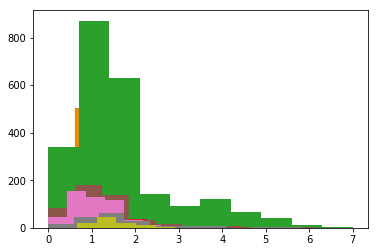

In [90]:
%matplotlib inline
t = max_train.col2.unique()
for target in t:
    st = max_train[max_train["col2"]==target]
    plt.hist(st["mean"])
plt.show()

In [9]:
max_train.to_csv("train/neg_flux/max_train2.csv")

In [11]:
max_train = pd.read_csv("train/neg_flux/max_train2.csv")
max_train.set_index("object_id", inplace=True)
max_train.head()

,no_of_max_0,no_of_max_1,no_of_max_2,no_of_max_3,no_of_max_4,no_of_max_5
object_id,,,,,,
615,9.0,14.0,13.0,13.0,14.0,14.0
713,12.0,10.0,11.0,12.0,10.0,9.0
730,21.0,12.0,6.0,6.0,4.0,11.0
745,14.0,3.0,3.0,2.0,4.0,7.0
1124,16.0,6.0,6.0,4.0,2.0,8.0


In [36]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

def dtw_query(series):
    study_df = series[["flux","passband"]]
    dist = []
    for i in range(5):
        for j in range(i+1,6):
            dist.append(fastdtw(study_df[study_df.passband==i],study_df[study_df.passband==j], dist = euclidean)[0])
    return pd.DataFrame(dist)




In [37]:
#DTW ONLY FOR NON NORMALIZED FLUX

dtw_train = applyParallel_1(df.groupby(["object_id"]),dtw_query)
new_columns = [
 "DTW" + str(k) + "-" + str(l) for k in range(5) for l in range(k+1,6)

]
dtw_train = dtw_train.T
dtw_train.columns = new_columns
dtw_train["object_id"] = objects_meta

In [38]:
dtw_train.set_index("object_id", inplace=True)
dtw_train.to_csv("train/neg_flux/dtw_train.csv")
dtw_train.head()

,DTW0-1,DTW0-2,DTW0-3,DTW0-4,DTW0-5,DTW1-2,DTW1-3,DTW1-4,DTW1-5,DTW2-3,DTW2-4,DTW2-5,DTW3-4,DTW3-5,DTW4-5
object_id,,,,,,,,,,,,,,,
615,35061.536158,24210.866916,18367.027896,15065.532712,14487.756560,26031.835134,27647.202925,36273.654063,36944.276025,7856.336917,14229.127889,14751.482711,6153.243755,9220.708458,2937.931631
713,146.267154,216.605467,265.912933,344.968492,475.563265,92.979495,155.995894,214.104759,355.567081,108.221701,160.977779,308.010969,128.780444,250.355226,213.702565
730,115.248362,278.797418,379.278996,494.543314,652.777853,176.194777,258.637676,369.975033,524.548479,129.628900,207.592320,385.492483,139.569941,303.518606,225.333517
745,336.126748,530.534046,792.541106,833.113763,799.973108,206.887719,390.314240,457.394768,543.423196,173.408124,255.238053,409.598389,189.154523,365.628799,369.308356
1124,309.447121,675.774864,769.662643,780.553292,716.784003,257.674139,372.141796,458.488116,534.628669,164.032823,259.591751,400.759720,164.987273,403.816037,344.198020


In [6]:
dtw_train = pd.read_csv("train/neg_flux/dtw_train.csv")
dtw_train.set_index("object_id", inplace=True)
#dtw_train.drop(["Unnamed: 0"],axis=1, inplace=True)
print (dtw_train.shape)
dtw_train.head(5)

(7848, 15)


,DTW0-1,DTW0-2,DTW0-3,DTW0-4,DTW0-5,DTW1-2,DTW1-3,DTW1-4,DTW1-5,DTW2-3,DTW2-4,DTW2-5,DTW3-4,DTW3-5,DTW4-5
object_id,,,,,,,,,,,,,,,
615,35061.536158,24210.866916,18367.027896,15065.532712,14487.756560,26031.835134,27647.202925,36273.654063,36944.276025,7856.336917,14229.127889,14751.482711,6153.243755,9220.708458,2937.931631
713,146.267154,216.605467,265.912933,344.968492,475.563265,92.979495,155.995894,214.104759,355.567081,108.221701,160.977779,308.010969,128.780444,250.355226,213.702565
730,115.248362,278.797418,379.278996,494.543314,652.777853,176.194777,258.637676,369.975033,524.548479,129.628900,207.592320,385.492483,139.569941,303.518606,225.333517
745,336.126748,530.534046,792.541106,833.113763,799.973108,206.887719,390.314240,457.394768,543.423196,173.408124,255.238053,409.598389,189.154523,365.628799,369.308356
1124,309.447121,675.774864,769.662643,780.553292,716.784003,257.674139,372.141796,458.488116,534.628669,164.032823,259.591751,400.759720,164.987273,403.816037,344.198020


In [134]:
print( df_meta.index)
print (dtw_train.index)
print (agg_train.index)
print (counts.index)
print (max_train.index)

Int64Index([      615,       713,       730,       745,      1124,      1227,
                 1598,      1632,      1920,      1926,
            ...
            130684460, 130695262, 130698059, 130716752, 130727624, 130739978,
            130755807, 130762946, 130772921, 130779836],
           dtype='int64', name='object_id', length=7848)
Int64Index([      615,       713,       730,       745,      1124,      1227,
                 1598,      1632,      1920,      1926,
            ...
            130684460, 130695262, 130698059, 130716752, 130727624, 130739978,
            130755807, 130762946, 130772921, 130779836],
           dtype='int64', name='object_id', length=7848)
Int64Index([      615,       713,       730,       745,      1124,      1227,
                 1598,      1632,      1920,      1926,
            ...
            130684460, 130695262, 130698059, 130716752, 130727624, 130739978,
            130755807, 130762946, 130772921, 130779836],
           dtype='int64', name=

In [15]:
df_meta2 = pd.concat([df_meta, max_train, agg_train], axis =1)
df_meta2


,ra,decl,gal_l,gal_b,ddf,hostgal_specz,hostgal_photoz,hostgal_photoz_err,distmod,mwebv,...,3__skewness,"4__fft_coefficient__coeff_0__attr_""abs""","4__fft_coefficient__coeff_1__attr_""abs""",4__kurtosis,4__skewness,"5__fft_coefficient__coeff_0__attr_""abs""","5__fft_coefficient__coeff_1__attr_""abs""",5__kurtosis,5__skewness,mjd_diff_det
object_id,,,,,,,,,,,,,,,,,,,,,
615,349.046051,-61.943836,320.796530,-51.753706,1,0.0000,0.0000,0.0000,NaN,0.017,...,0.293128,3245.366349,2741.539785,-1.548319,0.200096,2704.641265,2893.344217,-1.592820,0.125268,873.7903
713,53.085938,-27.784405,223.525509,-54.460748,1,1.8181,1.6267,0.2552,45.4063,0.007,...,-0.167176,50.414646,203.892482,-1.190245,-0.064134,100.473776,143.963093,-0.797047,0.218182,846.8017
730,33.574219,-6.579593,170.455585,-61.548219,1,0.2320,0.2262,0.0157,40.2561,0.021,...,2.662075,219.745132,202.532898,6.081065,2.537802,231.509177,199.286370,3.583130,1.680352,78.7737
745,0.189873,-45.586655,328.254458,-68.969298,1,0.3037,0.2813,1.1523,40.7951,0.007,...,3.751603,735.528417,680.055280,13.747434,3.476420,591.037583,523.503586,12.134629,3.170857,123.6872
1124,352.711273,-63.823658,316.922299,-51.059403,1,0.1934,0.2415,0.0176,40.4166,0.024,...,3.603208,574.553907,524.107264,16.377058,3.904008,393.114268,357.907185,14.434470,3.657305,133.9113
1227,35.683594,-5.379379,171.992947,-59.253501,1,0.0000,0.0000,0.0000,NaN,0.020,...,-0.043294,30.384898,23.255760,3.266776,0.247423,25.692383,78.643093,1.290034,0.535841,691.9633
1598,347.846710,-64.760857,318.929827,-49.143596,1,0.1352,0.1820,0.0304,39.7279,0.019,...,5.258898,1456.509807,1427.369431,26.549065,5.250405,1247.973644,1259.436078,25.959350,5.166856,15.1885
1632,348.595886,-63.072620,320.023289,-50.713060,1,0.6857,0.7014,0.0100,43.1524,0.021,...,-0.176070,170.126902,118.233896,0.271238,0.420304,347.136546,205.756949,0.948433,0.749570,2.9212
1920,149.414062,3.433834,234.919132,42.245550,1,0.3088,0.3229,0.3360,41.1401,0.027,...,2.388133,1046.324659,985.915697,4.231626,2.277800,858.921669,799.786455,3.553149,2.057099,100.8598


In [16]:
df_meta2.to_csv("train/neg_flux/df_meta_neg.csv")